<a href="https://colab.research.google.com/github/GeraldL19/Final-Year-Project-2024/blob/main/Data_Exploration_and_Preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import

In [1]:
!pip install -U ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.8/357.8 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 48.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 33.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 33.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 55.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 76.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=01e09dd8ec331ad10d26495f1d232f4d889f30004781d086d17ecc8c2c95d21a
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting unin

In [2]:
# Standard Library Imports
from pathlib import Path

# Installed packages
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import missingno as msno

# Profiling package
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file

In [3]:
#Import dataset from GoogleDrive
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/credit_risk_dataset.csv")
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


# Basic information

In [4]:
df.shape

(32581, 12)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [6]:
df.nunique()

person_age                      58
person_income                 4295
person_home_ownership            4
person_emp_length               36
loan_intent                      6
loan_grade                       7
loan_amnt                      753
loan_int_rate                  348
loan_status                      2
loan_percent_income             77
cb_person_default_on_file        2
cb_person_cred_hist_length      29
dtype: int64

In [7]:
# Quantitative variables:
num_cols = ["person_age", "person_income", "person_emp_length", "loan_amnt", "loan_int_rate",
            "loan_percent_income", "cb_person_cred_hist_length"]

# Set display options to suppress scientific notation
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [8]:
df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000,32581.000,31686.000,32581.000,29465.000,32581.000,32581.000,32581.000
mean,27.735,66074.848,4.790,9589.371,11.012,0.218,0.170,5.804
std,6.348,61983.119,4.143,6322.087,3.240,0.413,0.107,4.055
min,20.000,4000.000,0.000,500.000,5.420,0.000,0.000,2.000
25%,23.000,38500.000,2.000,5000.000,7.900,0.000,0.090,3.000
50%,26.000,55000.000,4.000,8000.000,10.990,0.000,0.150,4.000
75%,30.000,79200.000,7.000,12200.000,13.470,0.000,0.230,8.000
max,144.000,6000000.000,123.000,35000.000,23.220,1.000,0.830,30.000


*   The dataset has a total of 12 variables and 32581 observations.<br>
*   7 Numeric variables of variable range, 4 Categorical and 1 Boolean.<br>
*   The range for each variable is very different, this will cause a problem with the algorithms therefore we will have to scale the data before modeling.


# ydata Profiling

We are using ydata profiling in order to get an overview of the data quickly and efficiently.

Pandas Profiling is a Python library that automates the process of exploratory data analysis (EDA) for a given DataFrame. It generates a comprehensive and interactive HTML report, offering insights into the dataset's characteristics, including data types, distributions, missing values, and potential issues. The library's visualizations, such as histograms and correlation matrices, aid in quickly understanding data patterns. Pandas Profiling is a time-efficient tool for data cleaning and preprocessing, providing a holistic overview of the dataset's structure and content.

In [9]:
# Generate the Profiling Report
profile = ProfileReport(df, title="Titanic Dataset", html={"style": {"full_width": True}}, sort=None)

In [10]:
# The HTML report in an iframe
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

*   We have a total of 12 variables and 32581 observations.<br>
*   7 Numeric variables, 4 Categorical and 1 Boolean.<br>
*   4011 missing cells in 'person_emp_length'(895) and 'loan_int_rate'(3116)
*   165 duplicates rows
*   Some correlation

# **Data Preparation/Cleaning**

# Duplicate data

In [11]:
# Look for duplicated rows in the dataset
dups = df.duplicated()
dups.value_counts()

False    32416
True       165
dtype: int64

**We find 165 rows that are duplicates (0.5%).**

Duplicates are an extreme case of nonrandom sampling, and they can create a bias on our fitted model. Including them will essentially lead to the model overfitting this subset of points.

The simplest and most straightforward way to handle duplicate data is to delete it. This can reduce the noise and redundancy in your data, as well as improve the efficiency and accuracy of your models. (https://www.linkedin.com/advice/1/how-can-you-handle-duplicate-data-machine-learning#:~:text=The%20simplest%20and%20most%20straightforward,and%20accuracy%20of%20your%20models)

It is possible that 2 applicants have the same circumstances, but we consider it unlikely in our case due to the relatively small number of records, and due to the fact that there are such a small number of them, we decide to delete the duplicate rows.

In [12]:
# Deleting duplicate rows
df.drop_duplicates(inplace=True)

# Outliers

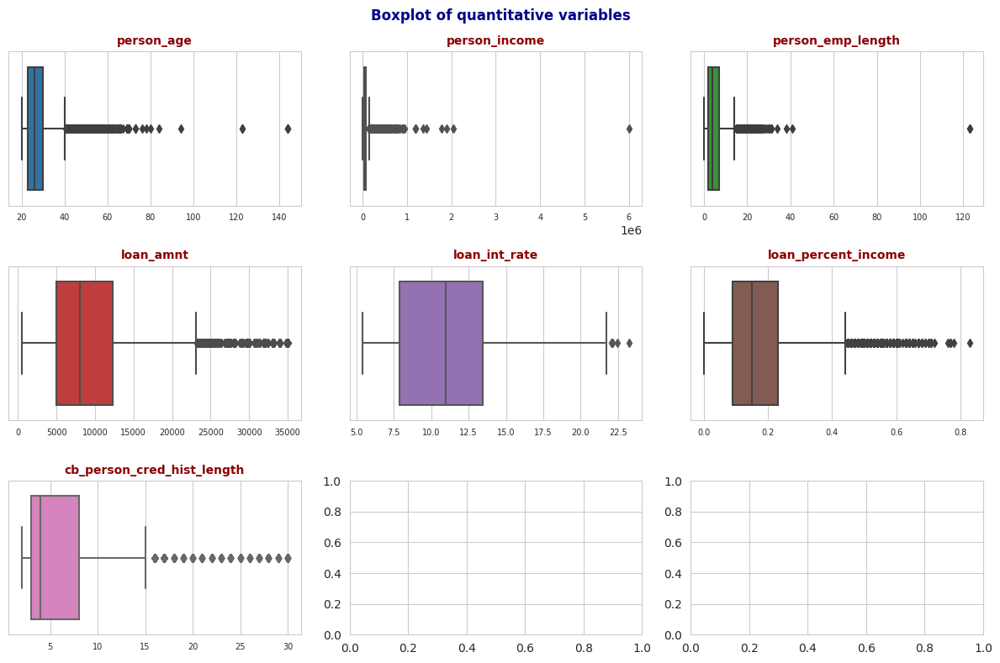

In [13]:
# Boxplot of the quantitative variables.
sns.set_style("whitegrid")
fig,axes = plt.subplots(nrows = 3, ncols = 3, figsize = (12,8))
axes = axes.flat

for i,col in enumerate(num_cols):
  sns.boxplot(df,
               x = col,
               color = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
               ax = axes[i])

  axes[i].set_xlabel("")
  axes[i].set_title(f"{col}", fontsize = 10, fontweight = "bold", color = "darkred")
  axes[i].tick_params(labelsize = 7)

fig.suptitle("Boxplot of quantitative variables", fontsize = 12, fontweight = "bold", color = "darkblue")
fig.tight_layout()
fig.show()

*   The 3 variables with very noticable outliers are person_age, person_income and person_emp_length.
*   We will explore those variables in more details.

**Age:**

Using domain knowledge.

Typically the upper limit for the age of a loan applicant is between 70 and 95yo. (https://www.gocompare.com/mortgages/older-people/#:~:text=Typically%2C%20the%20upper%20age%20limit,the%20mortgage%20term%20you%20require.)<br>

We can see on the box plot that there are some outliers values above this threashold.

In [14]:
# Count the number of rows with age greater than 90
count_of_outliers = df[df['person_age'] > 90].shape[0]
print("Number of Rows with Age > 90:", count_of_outliers)

# List the values of 'person_age' greater than 90
outliers_list = df[df['person_age'] > 90]['person_age'].tolist()
print("List of Values with Age > 90:", outliers_list)

Number of Rows with Age > 90: 6
List of Values with Age > 90: [144, 144, 123, 123, 144, 94]


There are 6 records with age > 90. Those age include, 144 and 123 years old which are unrealistic. We decide to eliminate those records.

In [15]:
# Delete the rows with 'person_age' greater than 90 from the DataFrame
df.drop(df.loc[df['person_age'] >= 90].index, inplace=True)

**Applicant Income**

We can see that there is a very big outlier that might affect our algorithm.

In [16]:
# Count the number of rows with age greater than 1000000
count_of_outliers = df[df['person_income'] > 1000000].shape[0]
print("Number of Rows with income > 1000000:", count_of_outliers)

# List the values of 'person_age' greater than 1000000
outliers_list = df[df['person_income'] > 1000000]['person_income'].tolist()
print("List of Values with income > 1000000:", outliers_list)

# Count the number of rows with age greater than 650000
count_of_outliers = df[df['person_income'] > 650000].shape[0]
print("Number of Rows with income > 650000:", count_of_outliers)

Number of Rows with income > 1000000: 8
List of Values with income > 1000000: [1200000, 1200000, 1200000, 2039784, 1362000, 1440000, 1782000, 1900000]
Number of Rows with income > 650000: 31


We now have 8 strong outliers with income above 1 million, and 31 records of applicant with an income of over 650000. This type of income puts you easily into the top 1% earners. Such income is rare but is reflective or the real world therefore we decide to keep those records.

**Employement Length**

Rarely more than 60.

In [17]:
# Count the number of rows with age greater than 60
count_of_outliers = df[df['person_emp_length'] > 60].shape[0]
print("Number of Rows with Age > 60:", count_of_outliers)

# List the values of 'person_age' greater than 60
outliers_list = df[df['person_emp_length'] > 60]['person_emp_length'].tolist()
print("List of Values with Age > 60:", outliers_list)

Number of Rows with Age > 60: 2
List of Values with Age > 60: [123.0, 123.0]


In [18]:
# Delete the rows with 'person_age' greater than 50 from the DataFrame
df.drop(df.loc[df['person_emp_length'] >= 60].index, inplace=True)

Only two outliers. We delete those records.

# Missing Values

Missing data are problematic because, depending on the type, they can sometimes cause bias. This means the results may not be generalizable outside of this study because your data come from an unrepresentative sample.

Those are inaccesible, lost forever values as we have no way of knowing the real value if they ever had one.

In our case the data point seems to be **Missing completely at random (MCAR)**

In [19]:
print(df.isnull().sum(), '\n')
print('Pecentage of missing values for perons_emp_length: ',df['person_emp_length'].isnull().mean() * 100)
print('Pecentage of missing values for loan_int_rate: ',df['loan_int_rate'].isnull().mean() * 100)

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              887
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3093
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64 

Pecentage of missing values for perons_emp_length:  2.7369785238212785
Pecentage of missing values for loan_int_rate:  9.543939767958529


<Axes: >

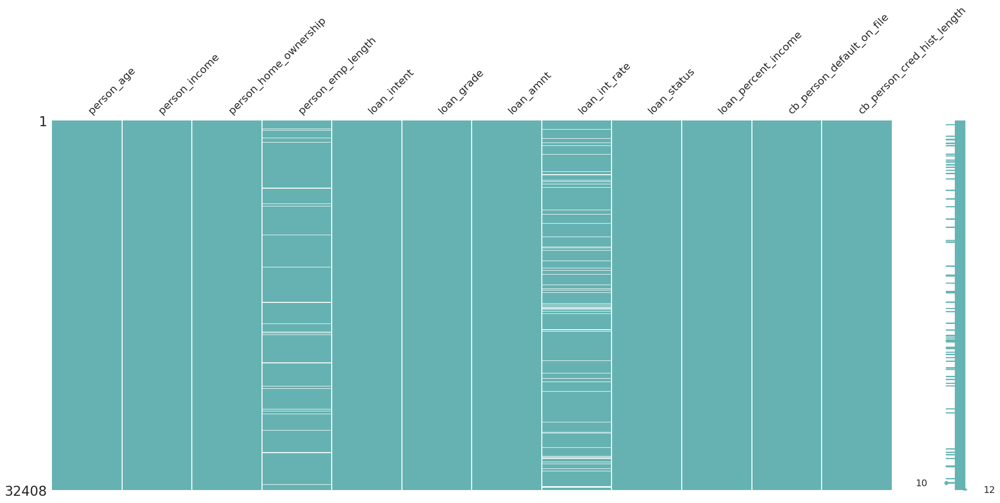

In [20]:
msno.matrix(df, color=[0.4,0.7,0.7])

*   'person_emp_length' has 887 missing values (2.7% of records) and 'loan_int_rate' has 3093 (9.5% of records). A total of 3980 missing values.
*   The matrix plot provides a colour fill for each column. When data is present, the plot is shaded , and when it is absent the plot is displayed in white. We can see that the missing data seems to appear at radnom througout the dataset.

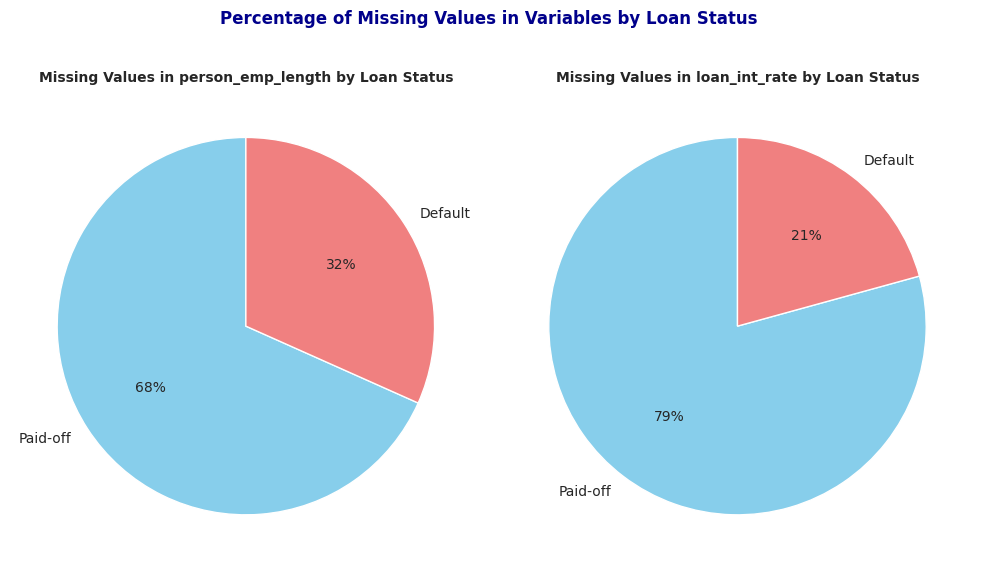

In [21]:
# Miss variables:
miss_cols = ["person_emp_length", "loan_int_rate"]

# Let's visualize the boxplot of the quantitative variables.
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 6))
axes = axes.flat

for i, col in enumerate(miss_cols):
    missing_values = df.groupby(["loan_status"])[col].apply(lambda x: x.isnull().sum())

    # Plot pie chart for missing values
    axes[i].pie(missing_values, labels=['Paid-off', 'Default'], autopct='%.0f%%', startangle=90, colors=['skyblue', 'lightcoral'])
    axes[i].set_title(f"Missing Values in {col} by Loan Status", fontsize=10, fontweight="bold")

fig.suptitle("Percentage of Missing Values in Variables by Loan Status", fontsize=12, fontweight="bold", color="darkblue")
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

*   32% of the missing values in the variables 'person_emp_length' are from application that have defaulted.
*   Only 21% for 'loam_int_rate'.

Deleting record because inputing data in the finance idustry could created unwanted biases that is not acceptable when trying to predict loan application outcome, we decide that balanced against the loss of information, this is the best outcome.

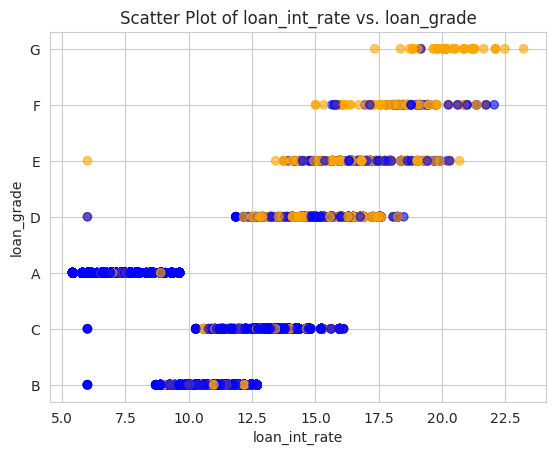

In [22]:
# Mapping loan_status to colors
colors = {0: 'blue', 1: 'orange'}

# Scatter plot with color based on loan_status
plt.scatter(df['loan_int_rate'], df['loan_grade'], c=df['loan_status'].map(colors), alpha=0.6)

# Customize the plot
plt.title('Scatter Plot of loan_int_rate vs. loan_grade')
plt.xlabel('loan_int_rate')
plt.ylabel('loan_grade')

# Show the plot
plt.show()

*   We can see a correlation between loan grade and interest rate. The lower the grade (D, E, F, G) the higher the interest rate. The opposite is true for higher grade A, B and C.

In [23]:
#Create a copy of the dataset
clean_df = df.copy()

'loan_int_rate' describes the interest rate offered on loans by Lenders. There is no fixed value as it varies from lender to lender. And it is correlated to the 'loan_grade' variables. The missing values for loan_int_rate represent 9.5% of the variables records. Therefore, an option could be to delete this variable.

Delete 'loan_int_rate' variable

In [24]:
# Drop column variable loan_int_rate
clean_df.drop(['loan_int_rate'],axis=1,inplace=True)

In [25]:
clean_df.isnull().sum()

person_age                      0
person_income                   0
person_home_ownership           0
person_emp_length             887
loan_intent                     0
loan_grade                      0
loan_amnt                       0
loan_status                     0
loan_percent_income             0
cb_person_default_on_file       0
cb_person_cred_hist_length      0
dtype: int64

In [26]:
# Drop rows containing missing values in column person_emp_length
clean_df = clean_df.dropna(subset = ['person_emp_length'])

In [27]:
#Export cleaned dataset to Google Drive
clean_df.to_csv('clean_data.csv')
clean_df.to_csv('/content/drive/MyDrive/Colab Notebooks/clean_data.csv')

In [28]:
clean_df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.000,EDUCATION,B,1000,0,0.100,N,2
2,25,9600,MORTGAGE,1.000,MEDICAL,C,5500,1,0.570,N,3
3,23,65500,RENT,4.000,MEDICAL,C,35000,1,0.530,N,2
4,24,54400,RENT,8.000,MEDICAL,C,35000,1,0.550,Y,4
5,21,9900,OWN,2.000,VENTURE,A,2500,1,0.250,N,2
...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.000,PERSONAL,C,5800,0,0.110,N,30
32577,54,120000,MORTGAGE,4.000,PERSONAL,A,17625,0,0.150,N,19
32578,65,76000,RENT,3.000,HOMEIMPROVEMENT,B,35000,1,0.460,N,28
32579,56,150000,MORTGAGE,5.000,PERSONAL,B,15000,0,0.100,N,26


# **Exploratory Data Analysis**

# Target Variable Analysis

Our target variable is the variable 'loan_status'. This variables indicate if an applicant has defaulted (1) or paid-off (0) his loan.

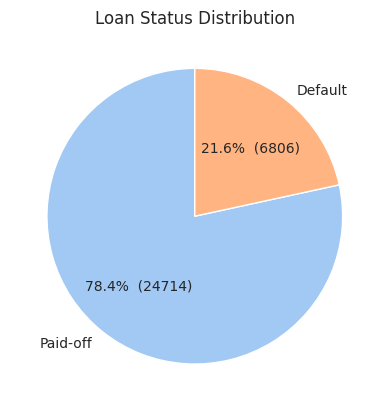

In [29]:
# Count the occurrences of each value in the 'loan_status' column
value_counts = clean_df['loan_status'].value_counts()

sns.set_palette('pastel')
# Plot the pie chart with custom colors and percentage labels
plt.pie(value_counts, labels=['Paid-off', 'Default'], autopct=lambda p: f'{p:.1f}%  ({int(p * sum(value_counts) / 100)})', startangle=90)
# Customize the plot as needed
plt.title('Loan Status Distribution')

# Show the plot
plt.show()

*   **The target variable is displaying some imbalance with only 21.6% of cases being 'default'**.<br>
*   This can cause some biases with the algorithms, therefore we need to pay attention to specific accuracy metrics during the testing and validation face to ensure there is no biases towards the majority class.<br>
*   If we find that this imbalance is affecting the performance of our algorithms  we might need to use resampling techniques such as SMOTE to help mitigate its effect.



# Categorical Variables Analysis

In [30]:
def plot_stacked_bar_with_percentages(data, category_col, status_col):
    # Create a DataFrame for the stacked bar chart
    df_crosstab = pd.crosstab(clean_df[category_col], clean_df[status_col], normalize='index') * 100

    # Plot the stacked bar chart with seaborn
    sns.set(style="whitegrid")
    plt.figure(figsize=(8, 6))
    ax = df_crosstab.plot(kind='bar', stacked=True, rot=0)

    # Change legend labels
    ax.legend(['Paid off', 'Default'])
    ax.legend(title='Loan Grade', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add percentage labels without overlapping
    for i, (index, row) in enumerate(df_crosstab.iterrows()):
        total_percentage = row.sum()
        height = 0
        for j, value in enumerate(row):
            if value > 2:  # Adjust the threshold as needed
                ax.text(i, height + value / 2, f'{value:.1f}%', ha='center', va='center', color='black', fontsize=8)
            height += value
    # Rotate x-axis labels by 45 degrees
    plt.xticks(rotation=45)

    # Set plot title and labels
    plt.title(f'{category_col} Distribution by {status_col}')
    plt.xlabel(category_col)
    plt.ylabel('Percentage')

    # Show the plot
    plt.show()

**Home Ownership**

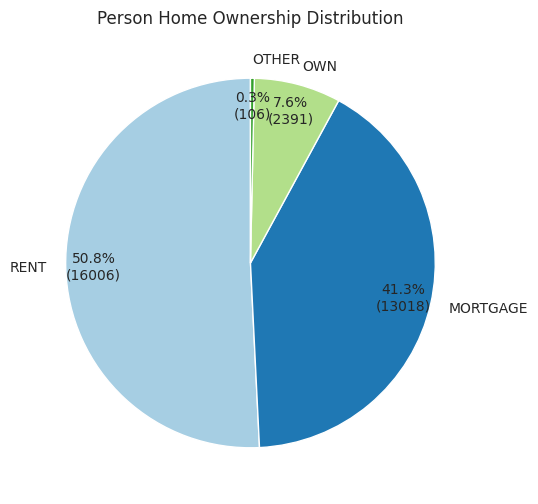

In [31]:
# Calculate value counts
home_counts = clean_df['person_home_ownership'].value_counts()
# Calculate the total
home_total = home_counts.sum()
# Set the figure size
plt.figure(figsize=(6, 6))
# Create a pie chart using Matplotlib
colors = plt.cm.Paired(range(len(home_counts)))
# Custom autopct function to display both percentage and total count
def my_autopct(pct):
    value = round(pct * home_total / 100)
    return f'{pct:.1f}%\n({value})'

plt.pie(home_counts, labels=home_counts.index, autopct=my_autopct,
        startangle=90, colors=colors, pctdistance=0.85)
# Set plot title
plt.title('Person Home Ownership Distribution')

# Show the plot
plt.show()

<Figure size 800x600 with 0 Axes>

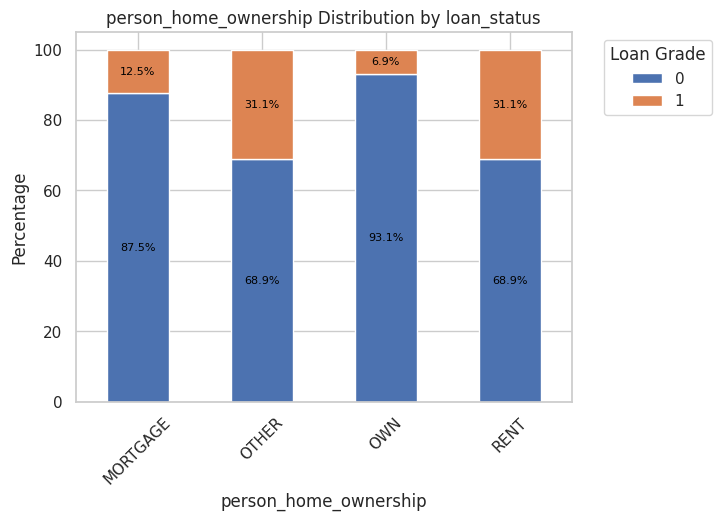

In [32]:
plot_stacked_bar_with_percentages(clean_df, 'person_home_ownership', 'loan_status')

*   We can observe that a majority or applicant either has a mortgage (41.3%) or rent (50.8%) their home, making up 91.2% of the whole datasets. Meaning most applicant do not own their home.<br>
*   'Other' has a very small number of cases with only 106 cases (0.3%)<br>
*   We can see that a higher number of loan where the applicant is either renting or 'other' are defaulting (31.1%) compared to applicants with a mortgage (12.5%).<br>
*   Home owners are highly likely to pay back their loan (93.1%).






**Loan Grade**

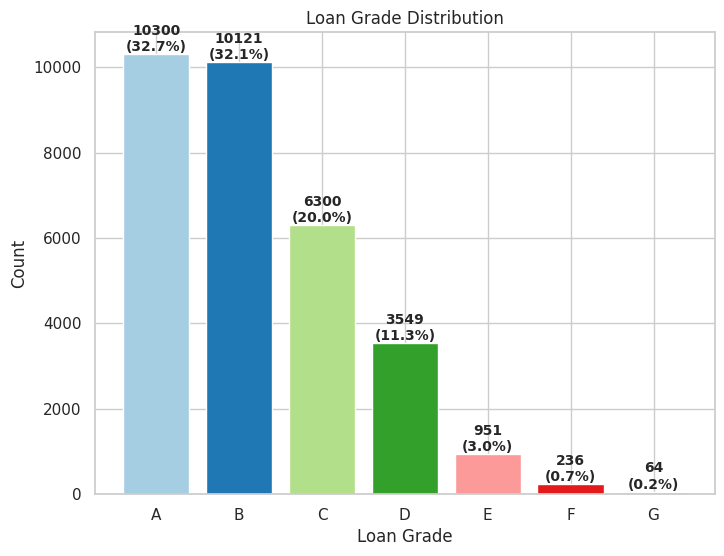

In [33]:
# Calculate value counts
grade_counts = clean_df['loan_grade'].value_counts()
# Calculate the total
grade_total = grade_counts.sum()
# Set the figure size
plt.figure(figsize=(8, 6))
# Create a bar chart using Matplotlib
colors = plt.cm.Paired(range(len(grade_counts)))

plt.bar(grade_counts.index, grade_counts, color=colors)
# Annotate with total counts
for i, (count, label) in enumerate(zip(grade_counts, grade_counts.index)):
    plt.text(i, count + 0.1, f'{count}\n({count/grade_total:.1%})', ha='center', va='bottom', fontsize=10, fontweight='bold')
# Set plot title and labels
plt.title('Loan Grade Distribution')
plt.xlabel('Loan Grade')
plt.ylabel('Count')

# Show the plot
plt.show()

<Figure size 800x600 with 0 Axes>

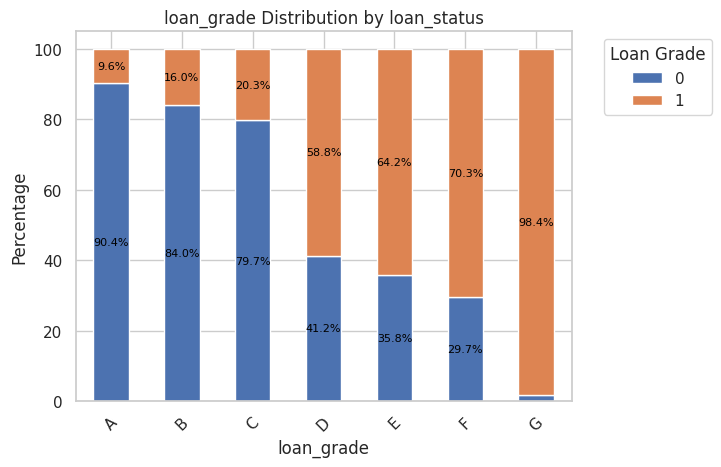

In [34]:
plot_stacked_bar_with_percentages(clean_df, 'loan_grade', 'loan_status')

*   Loan of grade A and B are the most frequent one, representing 64.8% of the dataset. On the other hand loan of grade E,F and G together represent less than 4% of cases.
*   For Loan of grade A, B, and C the vast majority of the loans have been paid off >=79%, it is the opposite for loans of grade D, E, F and G <=42%.



**Loan Intent**

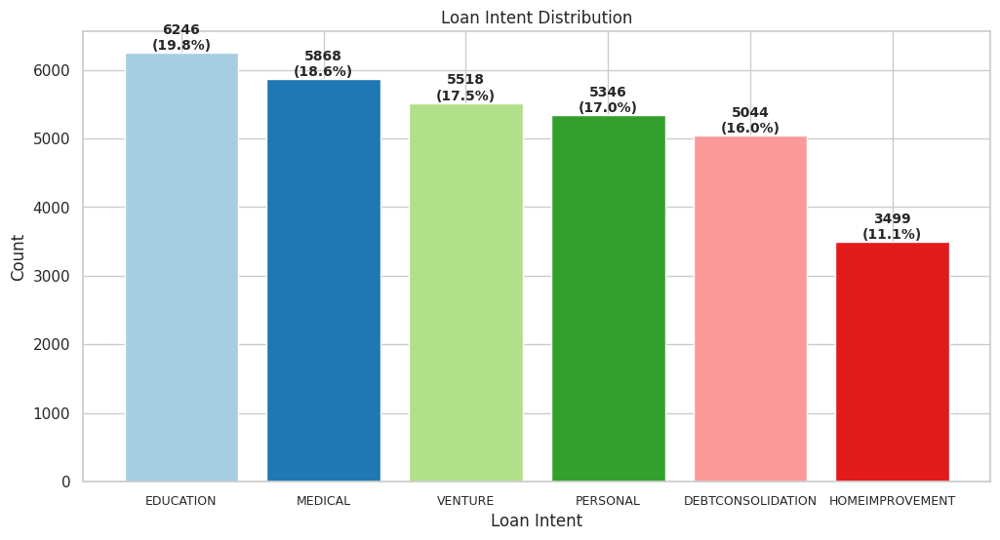

In [35]:
# Calculate value counts
intent_counts = clean_df['loan_intent'].value_counts()
# Calculate the total
intent_total = intent_counts.sum()
# Set the figure size
plt.figure(figsize=(12, 6))
# Create a bar chart using Matplotlib
colors = plt.cm.Paired(range(len(intent_counts)))

plt.bar(intent_counts.index, intent_counts, color=colors)
# Annotate with total counts
for i, (count, label) in enumerate(zip(intent_counts, intent_counts.index)):
    plt.text(i, count + 0.1, f'{count}\n({count/intent_total:.1%})', ha='center', va='bottom', fontsize=10, fontweight='bold')
# Set plot title and labels
plt.title('Loan Intent Distribution')
plt.xlabel('Loan Intent')
plt.ylabel('Count')
plt.xticks(fontsize=9)

# Show the plot
plt.show()

<Figure size 800x600 with 0 Axes>

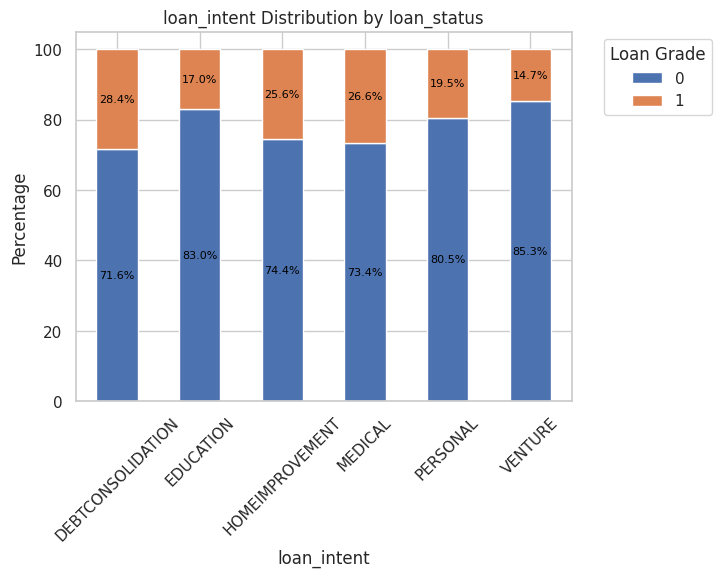

In [36]:
plot_stacked_bar_with_percentages(clean_df, 'loan_intent', 'loan_status')

*   Each class has between 5000 and6500 cases except Home Improvement, which has a slightly lower total number.
*   The ratio of Paid-off to Default is roughly the same for each loan intent, between 30% and 15% of cases having defaulted.  



**Person previously defaulted**

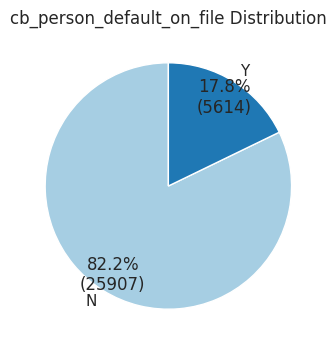

In [37]:
# Calculate value counts
home_counts = clean_df['cb_person_default_on_file'].value_counts()
# Calculate the total
home_total = home_counts.sum()
# Set the figure size
plt.figure(figsize=(4, 4))
# Create a pie chart using Matplotlib
colors = plt.cm.Paired(range(len(home_counts)))
# Custom autopct function to display both percentage and total count
def my_autopct(pct):
    value = round(pct * home_total / 100)
    return f'{pct:.1f}%\n({value})'

plt.pie(home_counts, labels=home_counts.index, autopct=my_autopct,
        startangle=90, colors=colors, pctdistance=0.85)
# Set plot title
plt.title('cb_person_default_on_file Distribution')

# Show the plot
plt.show()

<Figure size 800x600 with 0 Axes>

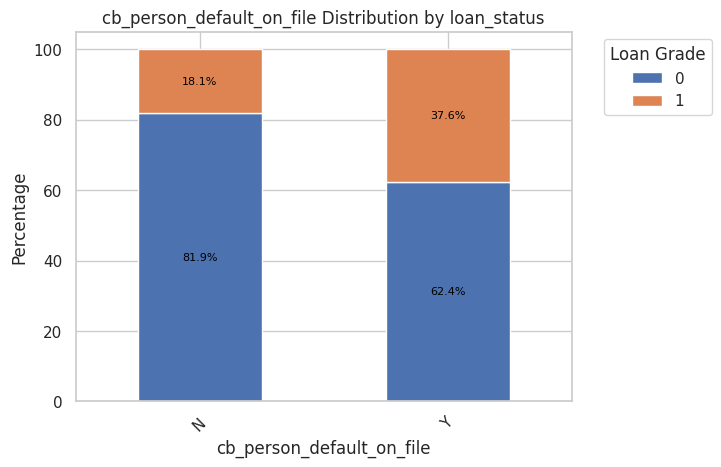

In [38]:
plot_stacked_bar_with_percentages(clean_df, 'cb_person_default_on_file', 'loan_status')

*   We can see that 82.3% of all loan applicants never had previously defaulted.*   From the applicants that never defaulted previously only 18.4% Defaulted on their loan.
*   If an applicant had previously defaulted on a loan he is more like to default again, with 37.9% of applicant with previous default, defaulting on their current loan.

# Pair plot

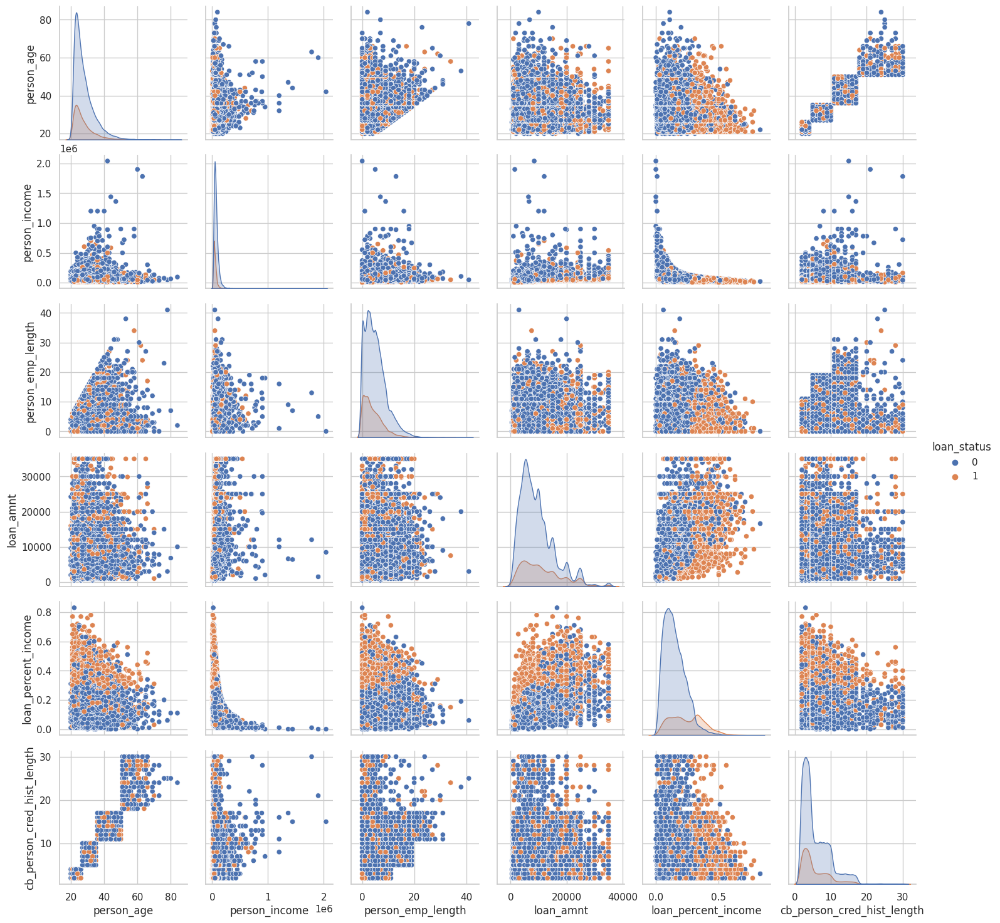

In [39]:
sns.pairplot(clean_df, hue="loan_status")

**With only a sample of 1000 records**

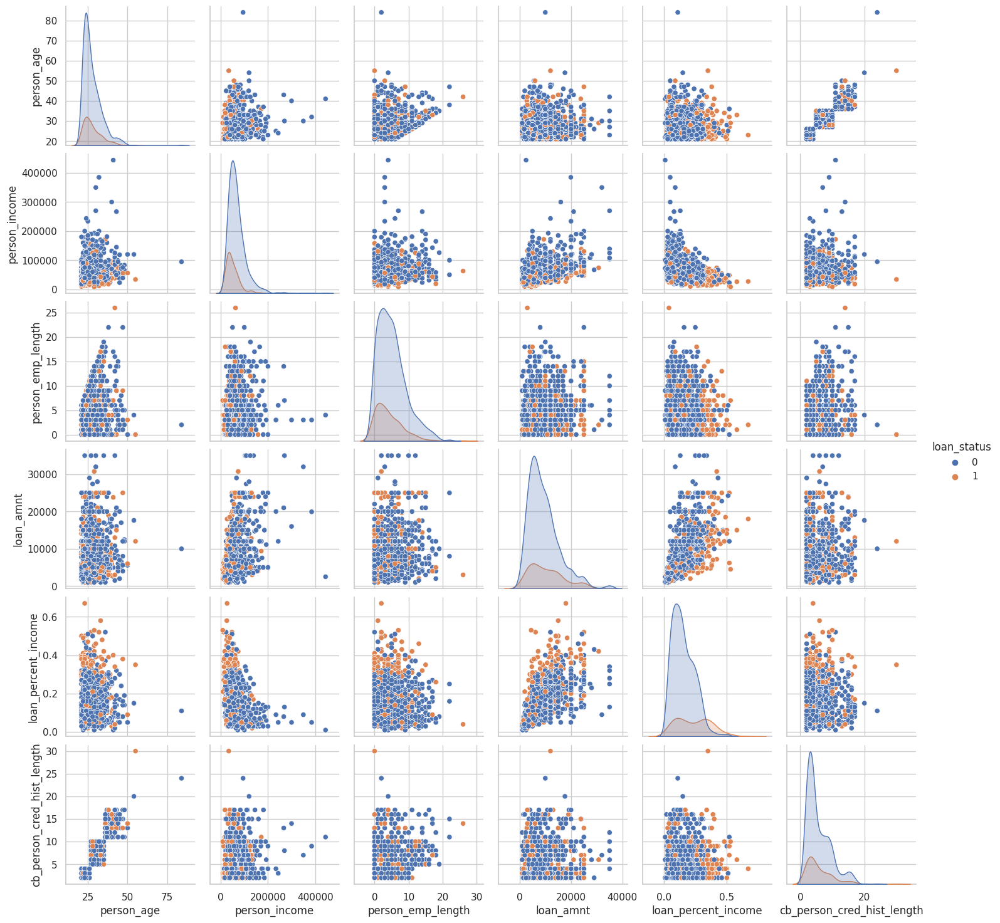

In [40]:
sns.pairplot(clean_df.sample(n=1000, random_state=42), hue="loan_status")

**With log scaling**

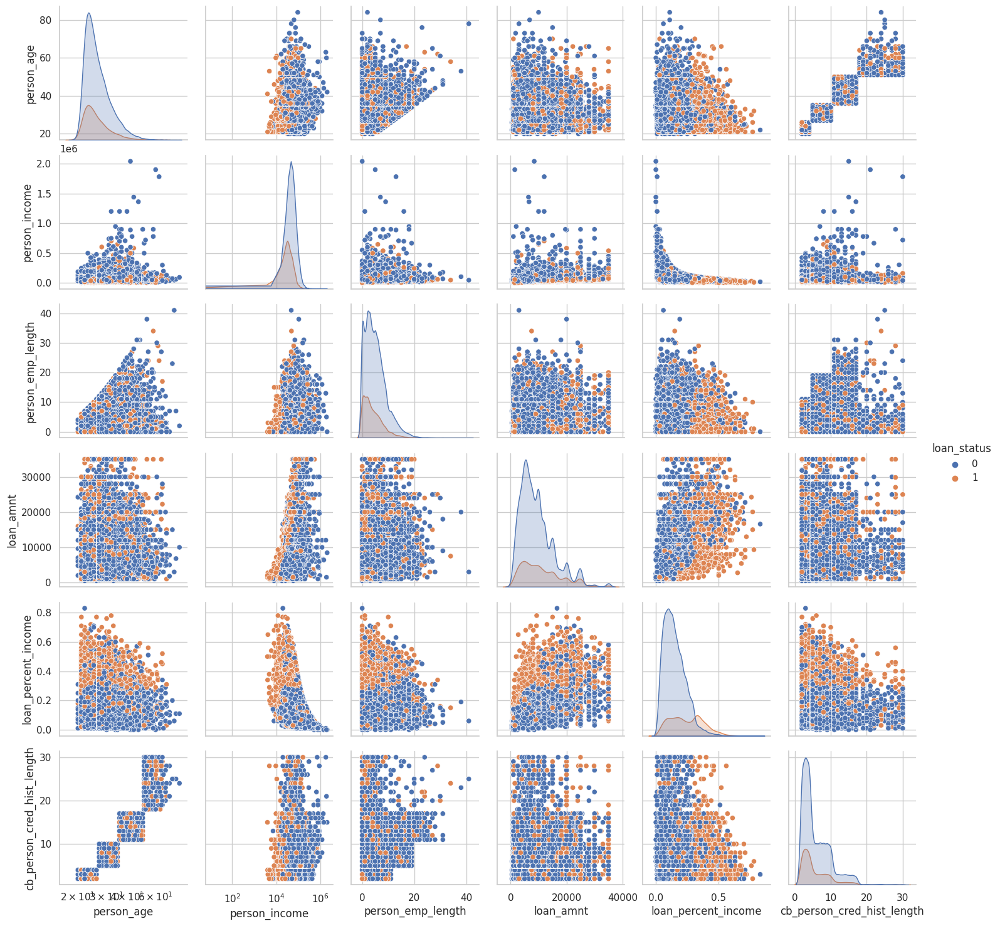

In [41]:
log_columns = ["person_income", "person_age", "perons_emp_length"]

pp = sns.pairplot(clean_df, hue="loan_status")

for ax in pp.axes.flat:
    if ax.get_xlabel() in log_columns:
        ax.set(xscale="log")

*   We can see a non-linear relationship between 'loan_percent_income' and 'person_income'. The smaller the income the more likely it is that th epercentage of income will be higher, the inverse is true for higher income that are more likely to have lower percentage of income. This makes sense. **We also notice that 'Default' is more likely to hapen for applicant with low income and high loan percentage income.**
*   There is a strange looking relationship between 'person_age' and 'cb_person_cre_hist_legth'. **The older the applicant the higher the credit history length.**
*   Looking at the distribution grapth we can see that and 'loan_percent_income' seem to be good indicater for default as there is a lack of overlap beteen the two curves.

# Distribution

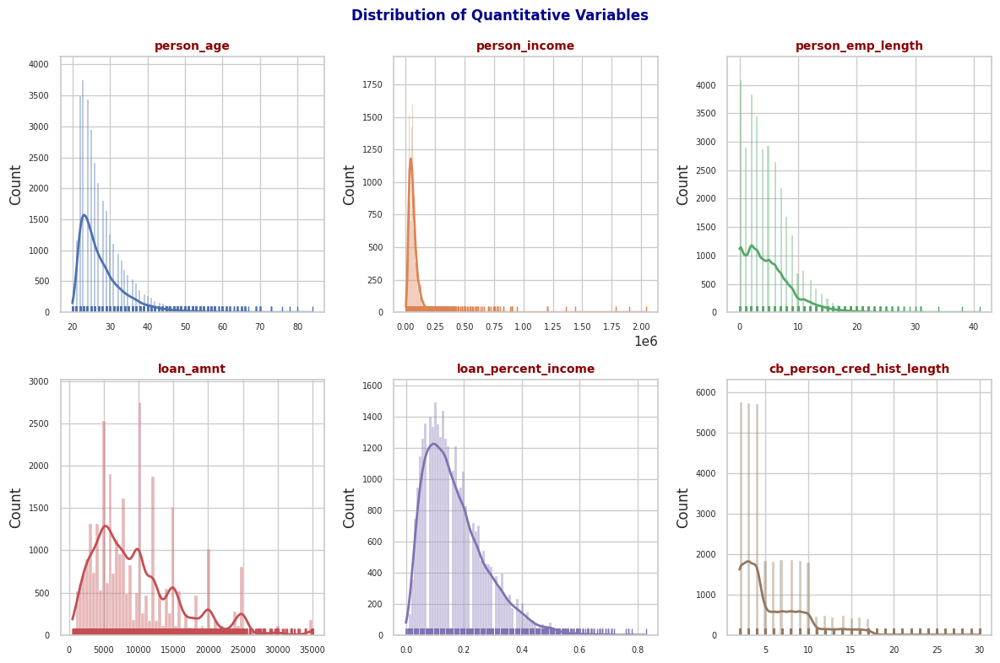

In [42]:
num_cols = ["person_age", "person_income", "person_emp_length", "loan_amnt",
            "loan_percent_income", "cb_person_cred_hist_length"]

# Assuming df is your DataFrame with quantitative variables
sns.set_style("whitegrid")

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))
axes = axes.flat

# Apply log transformation to specified variables
# log_transform_cols = ["person_age", "person_income", "person_emp_length"]
# df[log_transform_cols] = df[log_transform_cols].apply(np.log1p)

for i, col in enumerate(num_cols):
    sns.histplot(clean_df, x=col, stat="count", kde=True, line_kws={"linewidth": 2.0},
                alpha=0.4, color=(list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"], ax=axes[i])

    sns.rugplot(clean_df, x=col, color=(list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"], ax=axes[i])

    axes[i].set_xlabel("")
    axes[i].set_title(f"{col}", fontsize=10, fontweight="bold", color="darkred")
    axes[i].tick_params(labelsize=7)

fig.suptitle("Distribution of Quantitative Variables", fontsize=12, fontweight="bold", color="darkblue")
fig.tight_layout()
plt.show()

# Correlation

<ipython-input-43-89146b533f97>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(clean_df.corr(), square = True, annot = True,cmap='Blues')


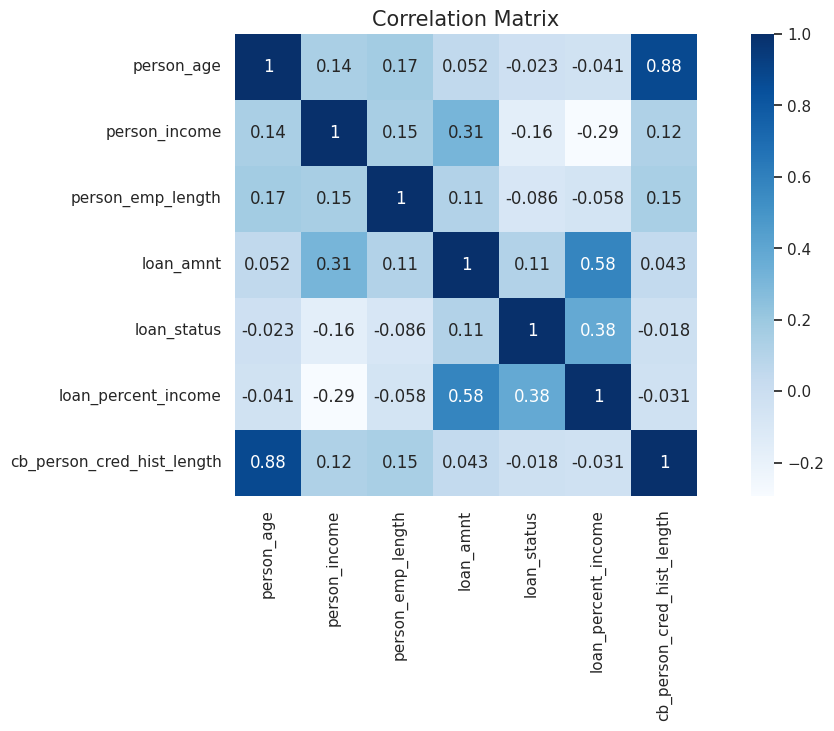

In [43]:
#Correlation matix to remake
fig, ax = plt.subplots()
fig.set_size_inches(14,6)
sns.heatmap(clean_df.corr(), square = True, annot = True,cmap='Blues')
plt.title('Correlation Matrix',fontsize=15);

*   We can see that there is a fairly strong correlation between 'cb_person_cred_hist_length' and 'person_age'.
*   'loan_amount' and 'loan_percent_income' have a small correlation.



# Multivariate distribution

**loan_grade across loan_intent**

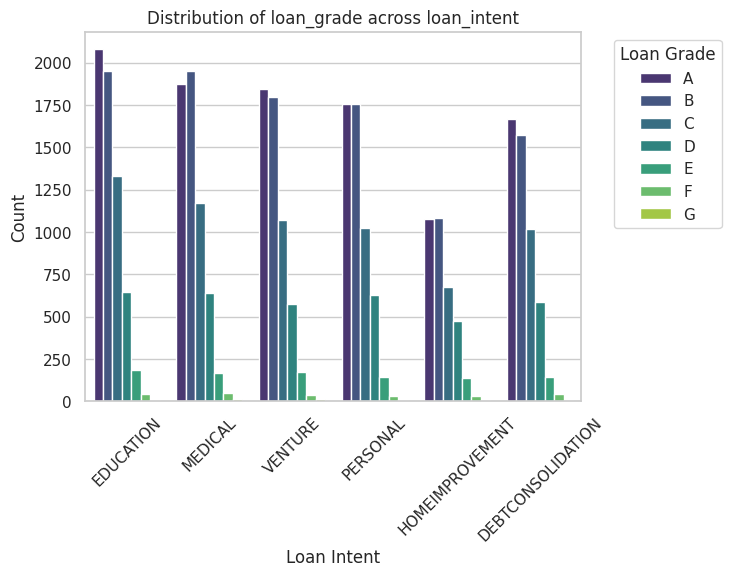

In [44]:
grade_order = ['A', 'B', 'C', 'D', 'E', 'F', 'G']

# Create a countplot with specified order
ax = sns.countplot(x='loan_intent', hue='loan_grade', data=clean_df, palette='viridis', order=clean_df['loan_intent'].unique(), hue_order=grade_order)

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=45)

# Customize the plot if needed
plt.title('Distribution of loan_grade across loan_intent')
plt.xlabel('Loan Intent')
plt.ylabel('Count')

# Move the legend to the right outside the plot
ax.legend(title='Loan Grade', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

Diplay a similar distribultion of loan grade for each loan intent.

**Person Age across Person Home Ownership**

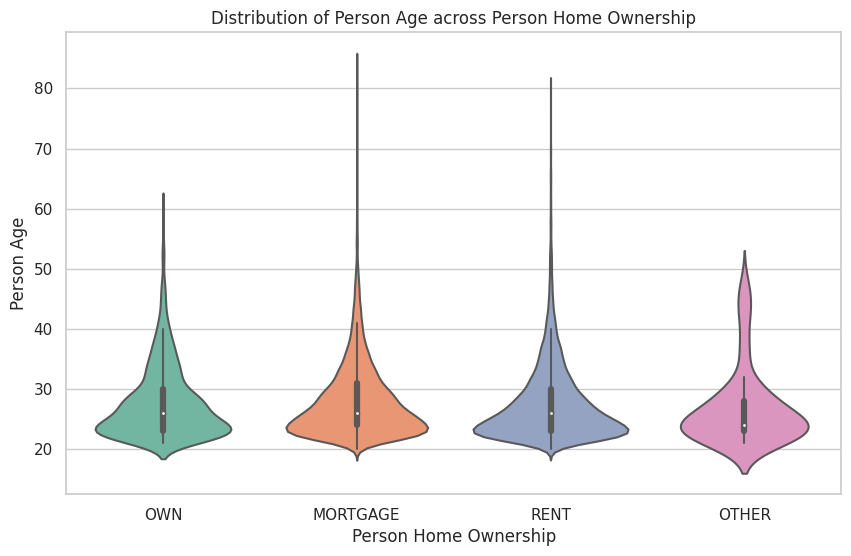

In [45]:
# Create a violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='person_home_ownership', y='person_age', data=clean_df, palette='Set2')

# Customize the plot if needed
plt.title('Distribution of Person Age across Person Home Ownership')
plt.xlabel('Person Home Ownership')
plt.ylabel('Person Age')

# Show the plot
plt.show()

**Person Age across Loan Intent**

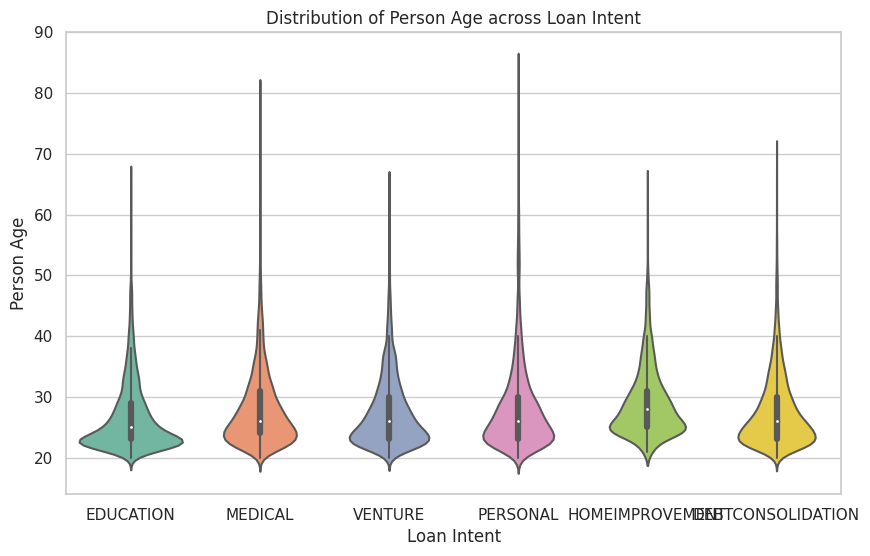

In [46]:
# Create a violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='loan_intent', y='person_age', data=clean_df, palette='Set2')

# Customize the plot if needed
plt.title('Distribution of Person Age across Loan Intent')
plt.xlabel('Loan Intent')
plt.ylabel('Person Age')

# Show the plot
plt.show()

# Emp_length = 0

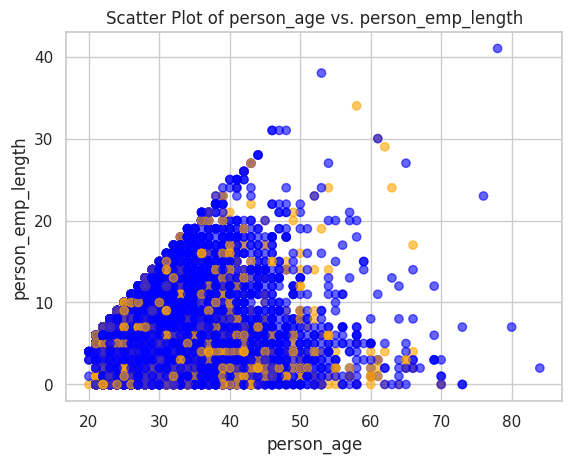

In [49]:
# Mapping loan_status to colors
colors = {0: 'blue', 1: 'orange'}

# Scatter plot with color based on loan_status
plt.scatter(clean_df['person_age'], clean_df['person_emp_length'], c=clean_df['loan_status'].map(colors), alpha=0.6)

# Customize the plot
plt.title('Scatter Plot of person_age vs. person_emp_length')
plt.xlabel('person_age')
plt.ylabel('person_emp_length')

# Show the plot
plt.show()

In [50]:
count_person_emp_length_zero = (clean_df['person_emp_length'] == 0).sum()
percentage_person_emp_length_zero = (count_person_emp_length_zero / len(clean_df)) * 100

print(f"Number of records where 'person_emp_length' is equal to 0: {count_person_emp_length_zero}")
print(f"Percentage of records where 'person_emp_length' is equal to 0: {percentage_person_emp_length_zero:.2f}%")


Number of records where 'person_emp_length' is equal to 0: 4086
Percentage of records where 'person_emp_length' is equal to 0: 12.96%


In [51]:
count_emp_length_zero_default = ((clean_df['person_emp_length'] == 0) & (clean_df['loan_status'] == 1)).sum()
count_emp_length_zero_paid = ((clean_df['person_emp_length'] == 0) & (clean_df['loan_status'] == 0)).sum()

print(f"Number of records where 'person_emp_length' is equal to 0 and 'loan_status' is 'default': {count_emp_length_zero_default}")
print(f"Number of records where 'person_emp_length' is equal to 0 and 'loan_status' is 'paid': {count_emp_length_zero_paid}")

Number of records where 'person_emp_length' is equal to 0 and 'loan_status' is 'default': 1143
Number of records where 'person_emp_length' is equal to 0 and 'loan_status' is 'paid': 2943


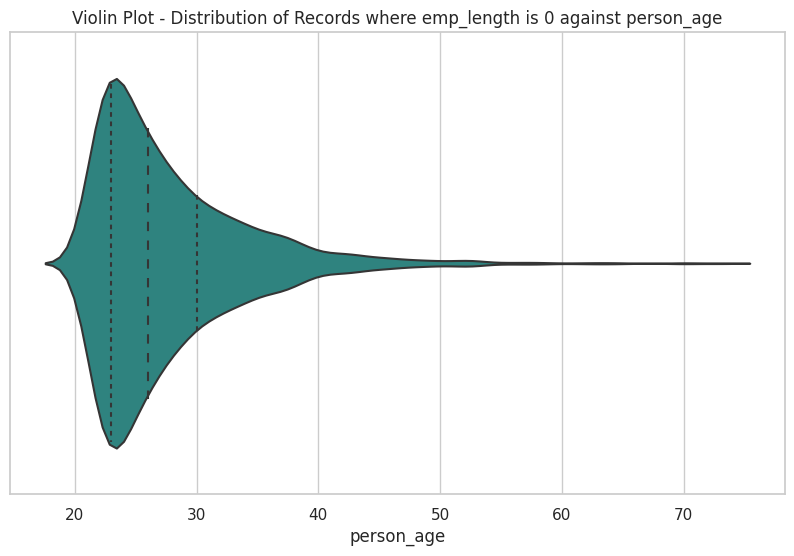

In [52]:
# Filter DataFrame for records where 'person_emp_length' is equal to 0
df_emp_length_zero = clean_df[clean_df['person_emp_length'] == 0]

# Create a violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x=df_emp_length_zero['person_age'], inner="quartile", palette="viridis")
plt.title('Violin Plot - Distribution of Records where emp_length is 0 against person_age')
plt.xlabel('person_age')
plt.show()